In [11]:
# Import packages
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

RSEED = 50


In [12]:
# Load data
train = pd.read_csv('../data/train.csv')
train.head()

,id,Soil_Type,Soil_pH,Soil_Moisture,Organic_Carbon,Electrical_Conductivity,Temperature_C,Humidity,Rainfall_mm,Sunlight_Hours,...,Crop_Type,Crop_Growth_Stage,Season,Irrigation_Type,Water_Source,Field_Area_hectare,Mulching_Used,Previous_Irrigation_mm,Region,Irrigation_Need
0,0,Loamy,4.92,32.58,1.01,3.05,15.01,50.61,725.99,5.90,...,Sugarcane,Sowing,Zaid,Drip,Rainwater,0.82,No,112.16,East,Low
1,1,Clay,7.08,56.61,0.44,2.00,22.92,67.86,985.66,6.98,...,Wheat,Vegetative,Kharif,Rainfed,River,5.27,Yes,47.16,South,Low
2,2,Clay,5.69,27.71,0.81,2.83,26.97,92.22,2201.70,6.05,...,Rice,Vegetative,Kharif,Sprinkler,Reservoir,8.24,Yes,110.38,North,Low
3,3,Sandy,5.65,13.32,1.33,0.87,13.32,61.57,1357.33,9.12,...,Wheat,Flowering,Kharif,Canal,River,8.32,Yes,53.85,South,Medium
4,4,Clay,7.96,59.14,0.38,0.96,20.22,91.11,1538.20,6.95,...,Wheat,Sowing,Rabi,Canal,River,7.37,No,93.19,South,Low


In [3]:
# Quick exploration
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 630000 entries, 0 to 629999
Data columns (total 21 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   id                       630000 non-null  int64  
 1   Soil_Type                630000 non-null  object 
 2   Soil_pH                  630000 non-null  float64
 3   Soil_Moisture            630000 non-null  float64
 4   Organic_Carbon           630000 non-null  float64
 5   Electrical_Conductivity  630000 non-null  float64
 6   Temperature_C            630000 non-null  float64
 7   Humidity                 630000 non-null  float64
 8   Rainfall_mm              630000 non-null  float64
 9   Sunlight_Hours           630000 non-null  float64
 10  Wind_Speed_kmh           630000 non-null  float64
 11  Crop_Type                630000 non-null  object 
 12  Crop_Growth_Stage        630000 non-null  object 
 13  Season                   630000 non-null  object 
 14  Irri

In [4]:
train.describe()

,id,Soil_pH,Soil_Moisture,Organic_Carbon,Electrical_Conductivity,Temperature_C,Humidity,Rainfall_mm,Sunlight_Hours,Wind_Speed_kmh,Field_Area_hectare,Previous_Irrigation_mm
count,630000.000000,630000.000000,630000.000000,630000.000000,630000.000000,630000.000000,630000.000000,630000.000000,630000.000000,630000.000000,630000.000000,630000.000000
mean,314999.500000,6.482497,37.304482,0.922858,1.744605,26.998166,61.563180,1462.207566,7.513382,10.375394,7.517745,62.318177
std,181865.479132,0.922504,16.377082,0.365808,0.952321,8.623621,19.708152,612.989738,1.999322,5.689458,4.218124,34.246939
min,0.000000,4.800000,8.000000,0.300000,0.100000,12.000000,25.000000,0.380000,4.000000,0.500000,0.300000,0.020000
25%,157499.750000,5.690000,23.340000,0.610000,0.930000,19.517500,45.390000,954.570000,5.760000,5.280000,3.880000,33.140000
50%,314999.500000,6.440000,37.750000,0.910000,1.740000,26.960000,61.650000,1467.160000,7.580000,10.480000,7.380000,61.150000
75%,472499.250000,7.270000,51.270000,1.220000,2.580000,34.540000,79.120000,2054.280000,9.250000,15.430000,11.140000,92.690000
max,629999.000000,8.200000,64.990000,1.600000,3.500000,42.000000,94.990000,2499.690000,11.000000,20.000000,15.000000,119.990000


In [5]:
train.dtypes

id                           int64
Soil_Type                   object
Soil_pH                    float64
Soil_Moisture              float64
Organic_Carbon             float64
Electrical_Conductivity    float64
Temperature_C              float64
Humidity                   float64
Rainfall_mm                float64
Sunlight_Hours             float64
Wind_Speed_kmh             float64
Crop_Type                   object
Crop_Growth_Stage           object
Season                      object
Irrigation_Type             object
Water_Source                object
Field_Area_hectare         float64
Mulching_Used               object
Previous_Irrigation_mm     float64
Region                      object
Irrigation_Need             object
dtype: object

In [6]:
# checking if target variable is imbalanced or not
train.Irrigation_Need.value_counts()

# -> turns out, the count for "high" irrigation need is very low -> imbalance!

Irrigation_Need
Low       369917
Medium    239074
High       21009
Name: count, dtype: int64

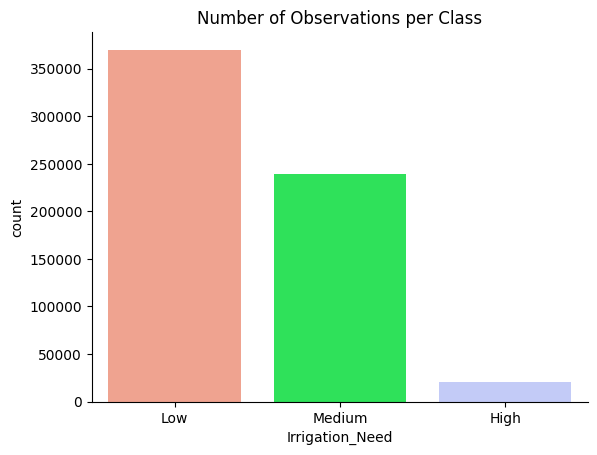

In [13]:
sns.countplot(data=train, x='Irrigation_Need', palette={'Low': '#FF9A80', 'Medium': '#11FF4A', 'High': '#BBC5FF'})
sns.despine()
plt.title("Number of Observations per Class")
plt.show()

array([[<Axes: title={'center': 'Soil_pH'}>,
        <Axes: title={'center': 'Soil_Moisture'}>,
        <Axes: title={'center': 'Organic_Carbon'}>],
       [<Axes: title={'center': 'Electrical_Conductivity'}>,
        <Axes: title={'center': 'Temperature_C'}>,
        <Axes: title={'center': 'Humidity'}>],
       [<Axes: title={'center': 'Rainfall_mm'}>,
        <Axes: title={'center': 'Sunlight_Hours'}>,
        <Axes: title={'center': 'Wind_Speed_kmh'}>],
       [<Axes: title={'center': 'Field_Area_hectare'}>,
        <Axes: title={'center': 'Previous_Irrigation_mm'}>, <Axes: >]],
      dtype=object)

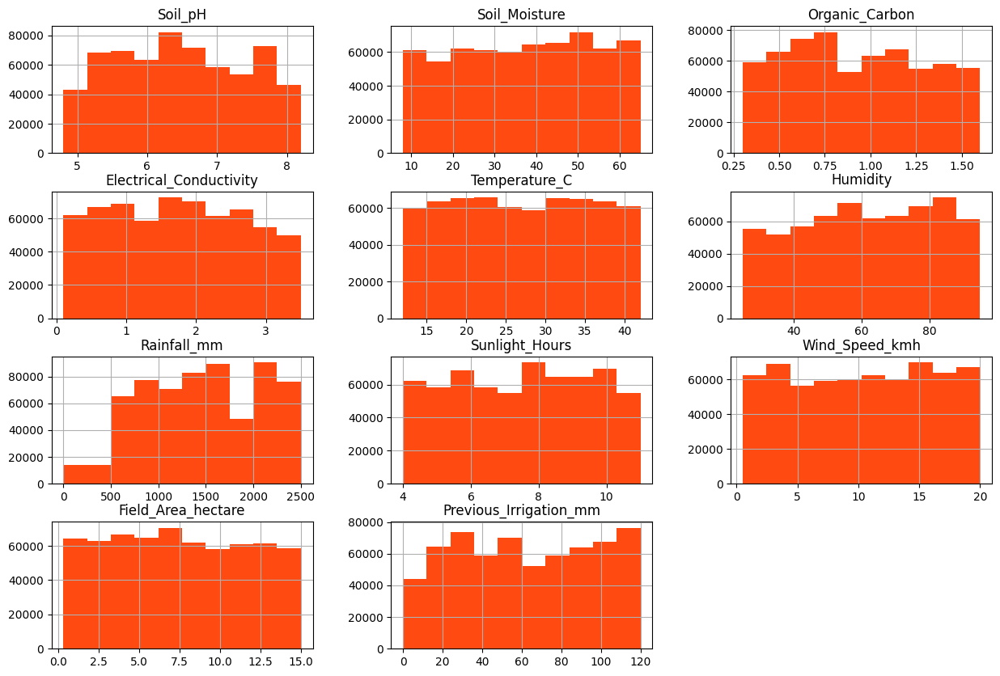

In [16]:
# checking numerical features: distribution, range, patterns?
train3 = train.copy().drop('id', axis=1)
train3.hist(figsize=(15,10), color='#FF4A11')

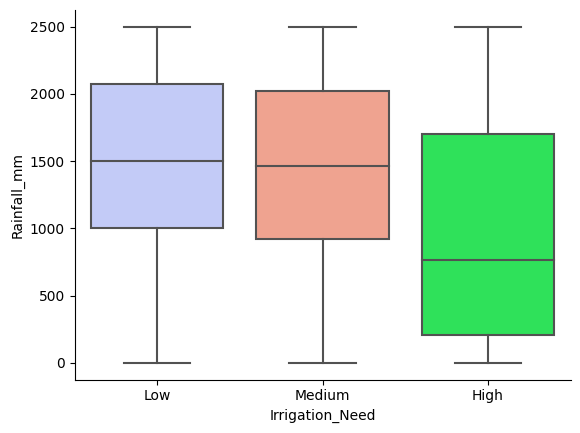

In [17]:
# relationships with irrigation_need:

# Rainfall
sns.boxplot(x="Irrigation_Need", y="Rainfall_mm", palette={'#FF9A80', '#11FF4A', '#BBC5FF'}, data=train)
sns.despine()

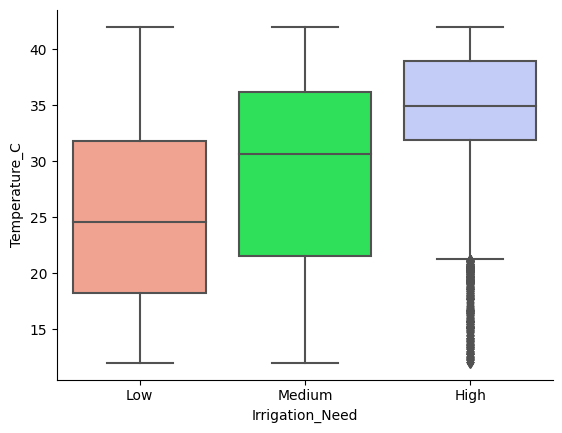

In [18]:
# Temperature
sns.boxplot(x="Irrigation_Need", y="Temperature_C", palette={'Low': '#FF9A80', 'Medium': '#11FF4A', 'High': '#BBC5FF'}, data=train)
sns.despine()

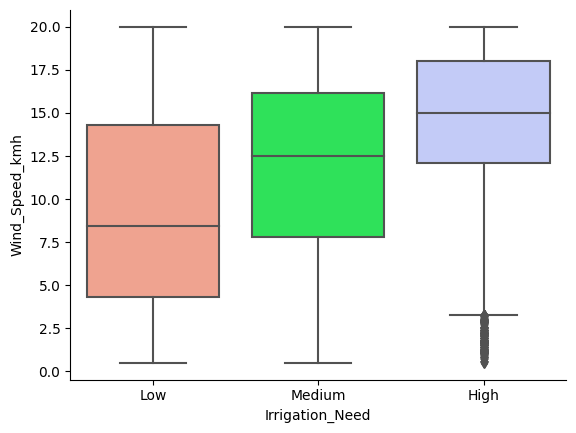

In [19]:
# Wind_Speed
sns.boxplot(x="Irrigation_Need", y="Wind_Speed_kmh", palette={'Low': '#FF9A80', 'Medium': '#11FF4A', 'High': '#BBC5FF'}, data=train)
sns.despine()

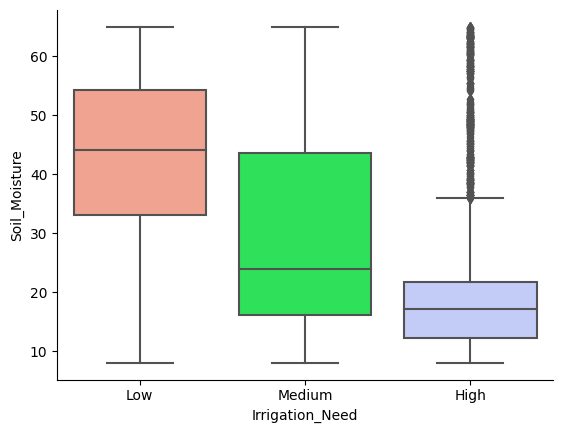

In [21]:
# Soil_Moisture
sns.boxplot(x="Irrigation_Need", y="Soil_Moisture", palette={'Low': '#FF9A80', 'Medium': '#11FF4A', 'High': '#BBC5FF'}, data=train)
sns.despine()

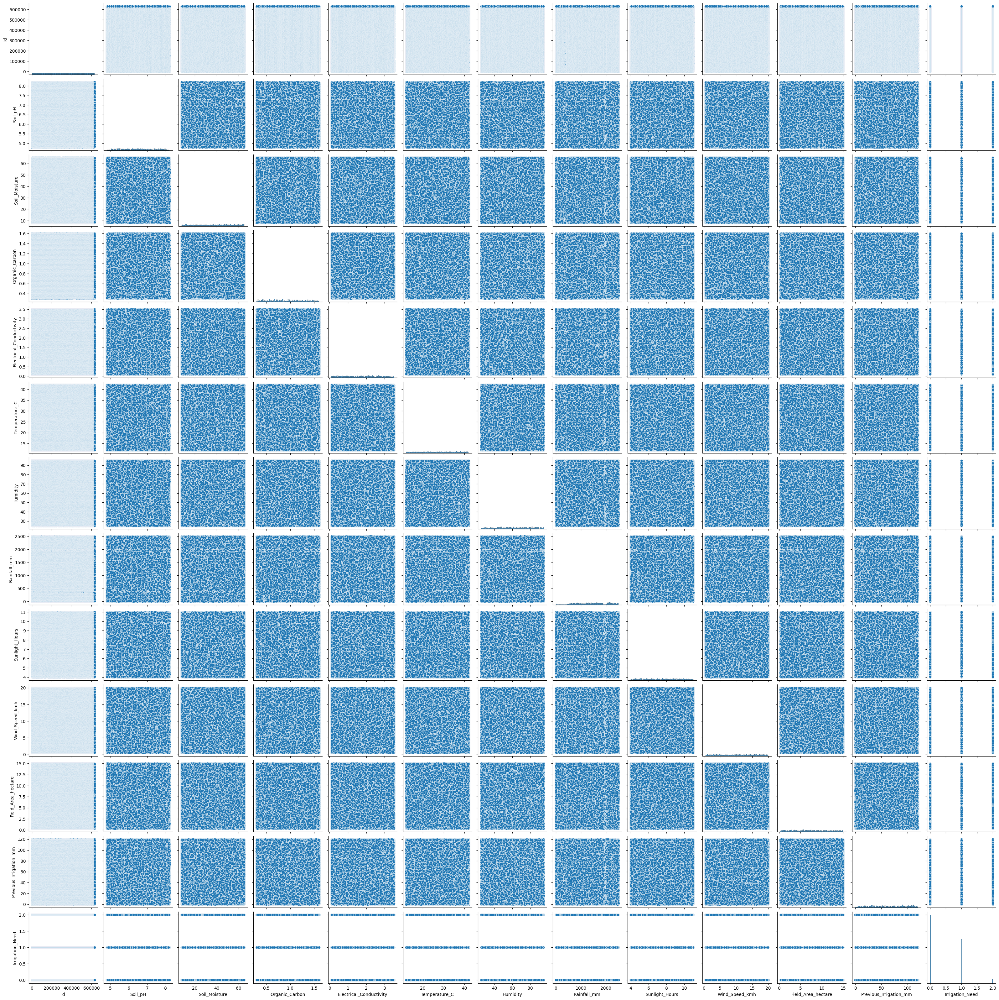

In [25]:
# pairplot to spot correlations
sns.pairplot(train)

In [ ]:
# encode irrigation_need to 0, 1, 2:
train['Irrigation_Need'] = train['Irrigation_Need'].map({"Low": 0, "Medium": 1, "High": 2})

In [27]:
# define num_col
num_col = [
    'Soil_pH',
    'Soil_Moisture',
    'Organic_Carbon',
    'Electrical_Conductivity',
    'Temperature_C',
    'Humidity',
    'Rainfall_mm',
    'Sunlight_Hours',
    'Wind_Speed_kmh',
    'Field_Area_hectare',
    'Previous_Irrigation_mm',
    #'Irrigation_Need'    
]

Text(0.5, 1.0, 'Correlation Heatmap for Numerical Features')

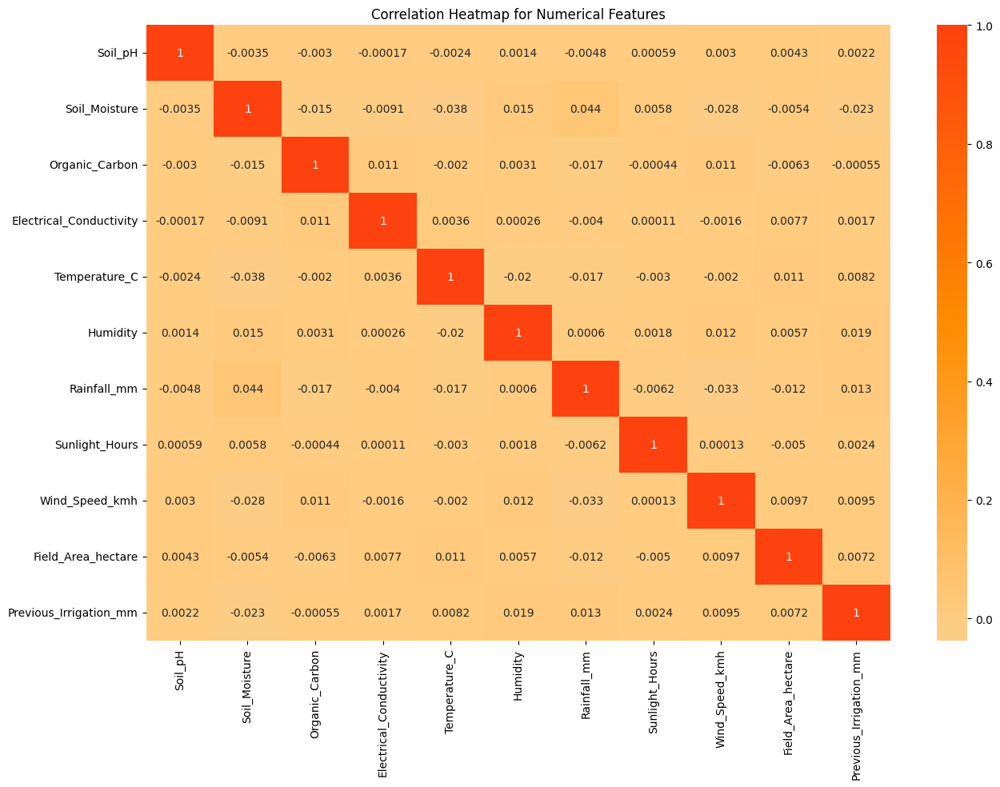

In [ ]:
# correlation heatmap:

# colormap
from matplotlib.colors import LinearSegmentedColormap
custom_cmap = LinearSegmentedColormap.from_list(
    "gray_to_orange",
    ["#F0FFFF", "#E0E0E0", "#FFCC80", "#FF8C00", "#FE420F"]
)
# dropping target
train4 = train.copy().drop('Irrigation_Need', axis=1)

# heatmap
plt.figure(figsize=(15,10))
sns.color_palette('pastel')
sns.heatmap(train4[num_col].corr(), annot=True, center=0, cmap=custom_cmap, xticklabels='auto')
plt.title('Correlation Heatmap for Numerical Features')

In [ ]:
# crosstab for categorical features

# Crop type
pd.crosstab(train['Crop_Type'], train['Irrigation_Need'], normalize='index')

Irrigation_Need,0,1,2
Crop_Type,,,
Cotton,0.587157,0.376750,0.036093
Maize,0.570133,0.387661,0.042206
Potato,0.575901,0.396686,0.027413
Rice,0.599867,0.376768,0.023365
Sugarcane,0.592875,0.367974,0.039152
Wheat,0.596456,0.371846,0.031697


In [ ]:
# Soil type
pd.crosstab(train['Soil_Type'], train['Irrigation_Need'], normalize='index')

Irrigation_Need,0,1,2
Soil_Type,,,
Clay,0.586963,0.377983,0.035054
Loamy,0.599265,0.371896,0.028839
Sandy,0.576317,0.385018,0.038665
Silt,0.586817,0.382867,0.030316


In [ ]:
# Crop Growth Stage
pd.crosstab(train['Crop_Growth_Stage'], train['Irrigation_Need'], normalize='index')

# -> could be a better predictor? at least it looks somewhat different xD

Irrigation_Need,0,1,2
Crop_Growth_Stage,,,
Flowering,0.305998,0.629596,0.064406
Harvest,0.847939,0.148859,0.003202
Sowing,0.871839,0.126534,0.001627
Vegetative,0.323792,0.612079,0.064129


In [ ]:
# Season
pd.crosstab(train['Season'], train['Irrigation_Need'], normalize='index')

Irrigation_Need,0,1,2
Season,,,
Kharif,0.571349,0.393824,0.034826
Rabi,0.599770,0.368115,0.032115
Zaid,0.591088,0.375875,0.033037


In [ ]:
# Region
pd.crosstab(train['Region'], train['Irrigation_Need'], normalize='index')

Irrigation_Need,0,1,2
Region,,,
Central,0.593014,0.372632,0.034354
East,0.593462,0.377837,0.028701
North,0.576253,0.389470,0.034278
South,0.586526,0.378721,0.034753
West,0.585766,0.379620,0.034614


In [ ]:
# Irrigation_Type
pd.crosstab(train['Irrigation_Type'], train['Irrigation_Need'], normalize='index')
# looks a little more interesting

Irrigation_Need,0,1,2
Irrigation_Type,,,
Canal,0.557952,0.403870,0.038178
Drip,0.594598,0.378690,0.026712
Rainfed,0.606676,0.360164,0.033160
Sprinkler,0.590719,0.374387,0.034895


In [ ]:
# Water source
pd.crosstab(train['Water_Source'], train['Irrigation_Need'], normalize='index')
# looks a little more interesting

Irrigation_Need,0,1,2
Water_Source,,,
Groundwater,0.601005,0.375525,0.023470
Rainwater,0.603704,0.362767,0.033529
Reservoir,0.562634,0.404739,0.032627
River,0.583016,0.373548,0.043437


Correlations in nature:

Soil type and soil pH:

- not a simple one-to-one-way correlation- soil pH depends on seveal factors, soil type is one of the most important though, because it influences how soils hold and exchange nutrients and acids
    - Sandy soils: typically more acidic because they drain quickly, lose basic nutrients like calcium and magnesium easily; common pH range: 5.0 - 6.5
    - Clay soils: tend to be neutral to slightly alkaline because of high nutrient-holding capacity (high cation exchange capacity), retain base cations (Ca2+, Mg2+. K+); common pH range: 6.5 - 8.0
    - Loamy soils: usually near neutral because of balanced mix of sand, silt, clay, organic matter; common pH range: 6.0 - 7.5
    - Silty soils: usually slightly acidic to neutral because of moderate drainage and moderate nutrient-holding capacity; common pH range: 6.0 - 7.0

<Axes: xlabel='Soil_Type', ylabel='Soil_pH'>

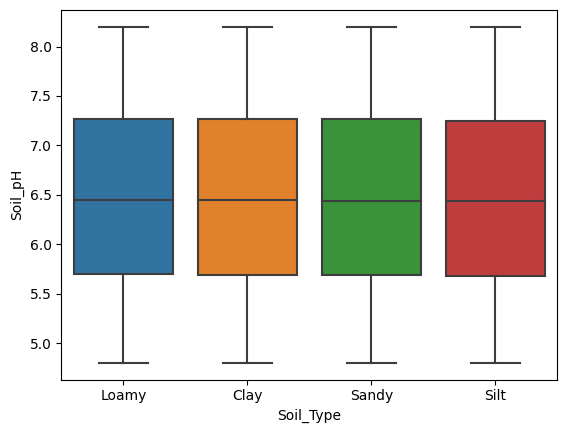

In [24]:
# Correlation PH and soil type:

sns.boxplot(data=train, x='Soil_Type', y='Soil_pH')